In [1]:
import cv2 as cv
import numpy as np
import glob
import pickle
import ml_metrics
import math
import pandas as pd
import os
import yaml

from matplotlib import offsetbox
from sklearn import manifold, datasets, decomposition, discriminant_analysis
from matplotlib import pyplot as plt 
from sklearn.cluster import KMeans
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.cluster import OPTICS, cluster_optics_dbscan
import matplotlib.gridspec as gridspec
from random import randint
from mpl_toolkits.mplot3d import Axes3D
from fcmeans import FCM

from evaluation_funcs import performance_accumulation_pixel
from evaluation_funcs import performance_evaluation_pixel
from bbox_iou import bbox_iou
from extract_features import extract_features
from compute_mask import compute_mask
from compute_mask_old import compute_mask_old
from text_removal_mask import text_removal_mask
from text_removal_mask2 import find_text
from search_queries import search
from compute_lbp import compute_lbp
from compute_hog import compute_hog
from compute_dct import compute_dct
from get_text import get_text
from compute_SIFT import compute_SIFT
from compute_SURF import compute_SURF
from search_matches import search_matches_FLANN
from search_matches import search_matches_BF

import tamura
import colorgram
import pywt
from skimage.segmentation import felzenszwalb
from skimage.segmentation import mark_boundaries
import matplotlib.pyplot as plt


## PARAMETERS ##
NBINS = 32        # Number of bins (from 0 to 255)
DIVISIONS = 2     # Number of divisions per dimension [2,4,8,...]
COLORSPACE = cv.COLOR_BGR2HSV

def embedding_plot(X, title):
    x_min, x_max = np.min(X, axis=0), np.max(X, axis=0)
    X = (X - x_min) / (x_max - x_min)

    plt.figure()
    ax = plt.subplot(aspect='equal')
    sc = ax.scatter(X[:,0], X[:,1], lw=0, s=40) # c=y/10.
    
    plt.xticks([]), plt.yticks([])
    plt.title(title)

print('Done')

Done


In [3]:
# Read DB
database = pickle.load(open('../features_tex_final.pkl','rb'))
print(np.shape(database))

(279, 28)


In [4]:
# Normalize
for i in range(np.shape(database)[1]): # N featues
    f=[]
    for j in range(len(database)):
        f.append(database[j][i])
    maxval = np.max(f)
    minval = np.min(f)
    for j in range(len(database)):
        database[j][i] -= minval
        database[j][i] /= (maxval - minval)

['#FB6420', '#718B84', '#9CB0D0', '#7A1C85', '#DAC1DE', '#BA67A1', '#026AC3', '#F03C48', '#D57534', '#33CAB1']


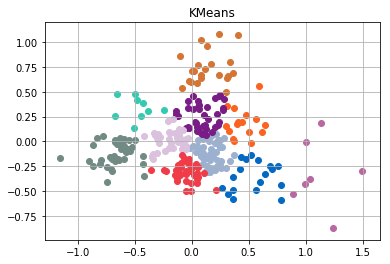

"\n# Create a 3D plot independently of the number of components\nfig = plt.figure()\nax = fig.add_subplot(111, projection='3d')\nfor k, col in zip(range(k), colors):\n    my_members = labels == k\n    cluster_center = k_means_cluster_centers[k]\n    ax.scatter(result['PCA0'][my_members], result['PCA1'][my_members], result['PCA2'][my_members], c=col, marker='o')\nplt.title('KMeans')    \nplt.grid(True)\nplt.show()\n"

In [10]:
#Principal component analysis
N_COMPONENTS = 2

# Scatter plot PCA 
db = np.array(database)
n_samples, n_features = db.shape

X_pca = decomposition.PCA(n_components=N_COMPONENTS).fit_transform(db)

# Store results of PCA in a data frame
result=pd.DataFrame(X_pca, columns=['PCA%i' % i for i in range(N_COMPONENTS)])

k=10
k_means = KMeans(init='k-means++', n_clusters=k, n_init=100)
k_means.fit(X_pca)
labels = k_means.labels_
k_means_cluster_centers = k_means.cluster_centers_
k_means_labels_unique = np.unique(labels)

colors = []
for i in range(k):
    colors.append('#%06X' % randint(0, 0xFFFFFF))
print(colors)

if N_COMPONENTS == 2:
    fig = plt.figure()
    for k, col in zip(range(k), colors):
        my_members = labels == k
        cluster_center = k_means_cluster_centers[k]
        plt.scatter(result['PCA0'][my_members], result['PCA1'][my_members], c=col, marker='o')
    plt.title('KMeans')    
    plt.grid(True)
    plt.show()
else:
    # Create a 3D plot independently of the number of components
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    for k, col in zip(range(k), colors):
        my_members = labels == k
        cluster_center = k_means_cluster_centers[k]
        ax.scatter(result['PCA0'][my_members], result['PCA1'][my_members], result['PCA2'][my_members], c=col, marker='o')
    plt.title('KMeans')    
    plt.grid(True)
    plt.show()

Room 1


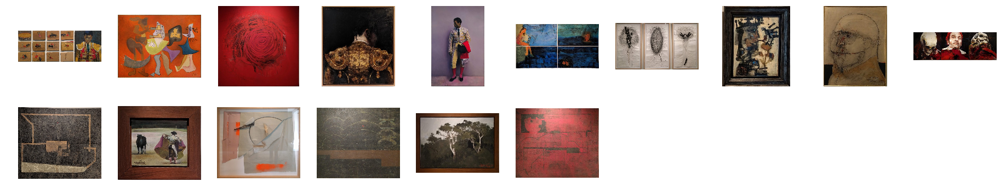

Room 2


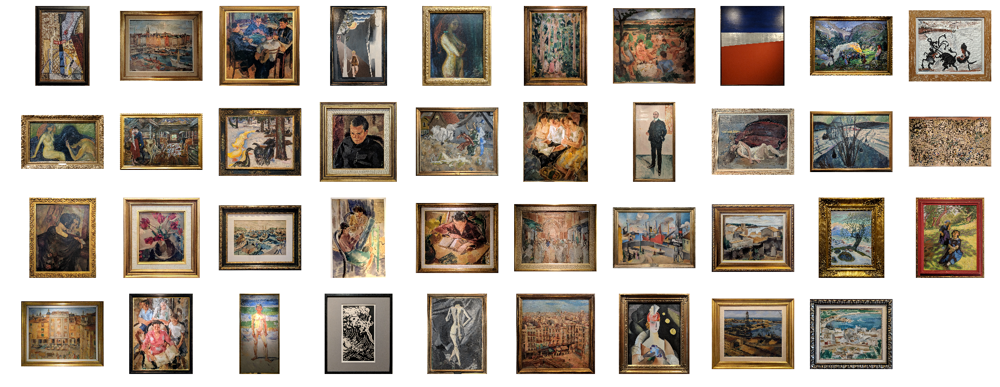

Room 3


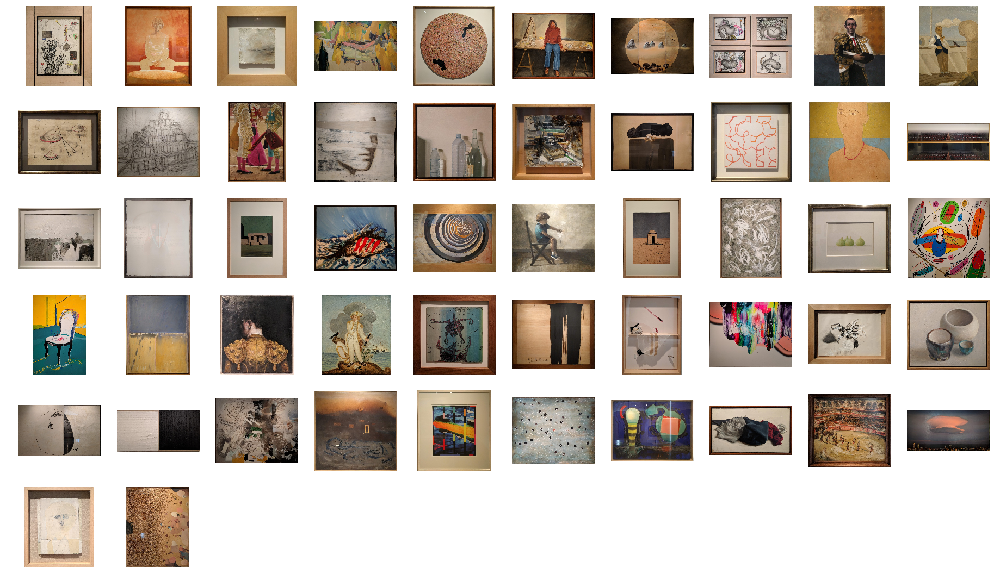

Room 4


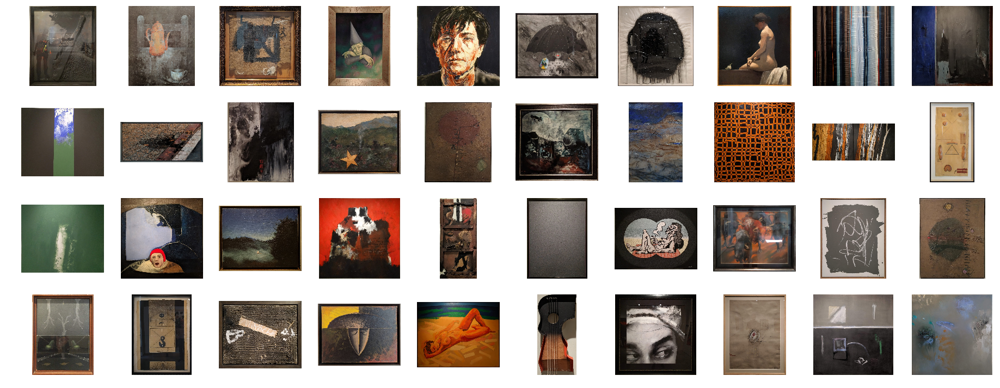

Room 5


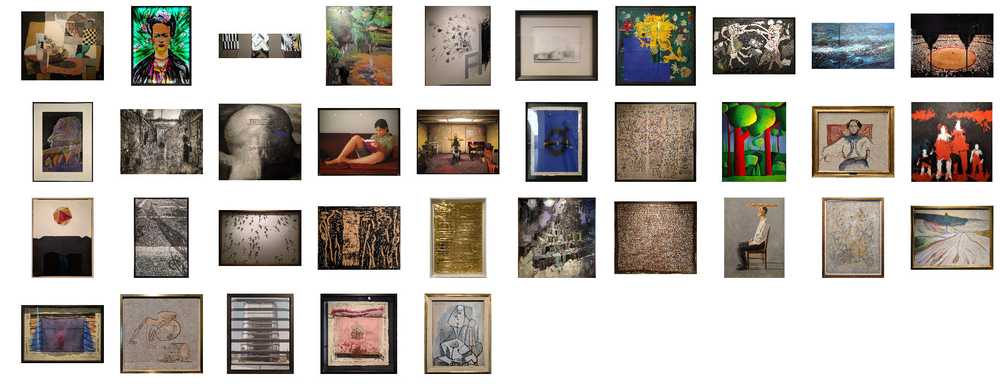

Room 6


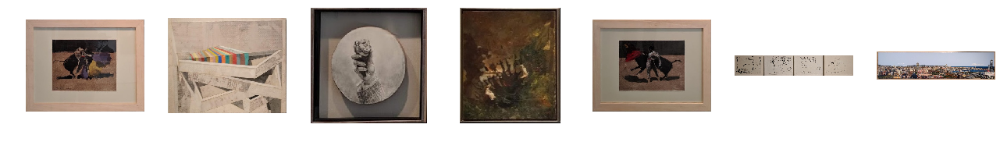

Room 7


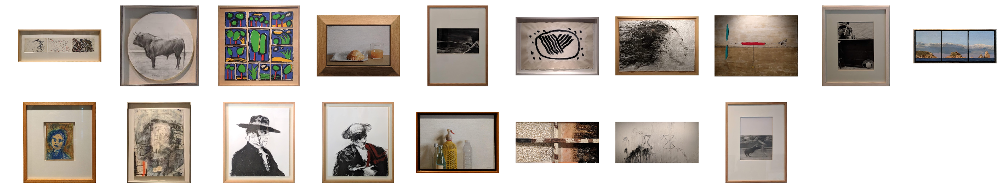

Room 8


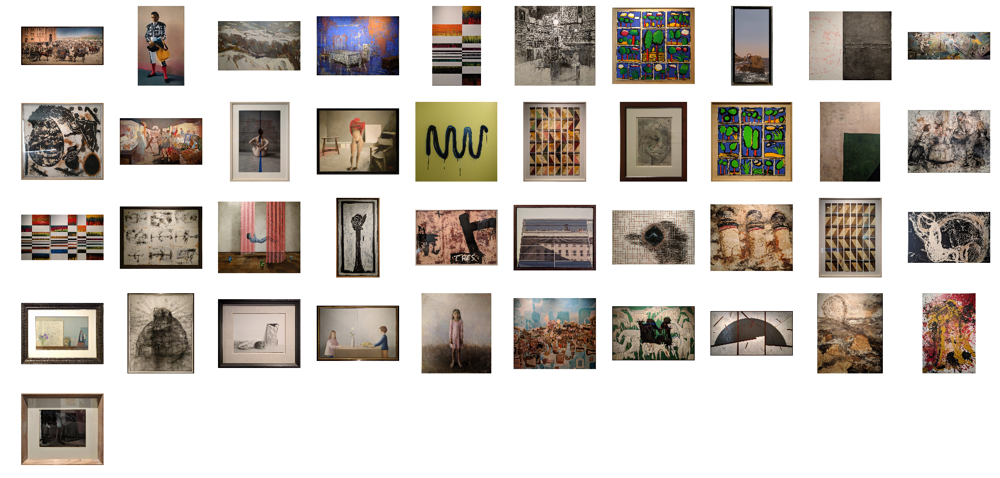

Room 9


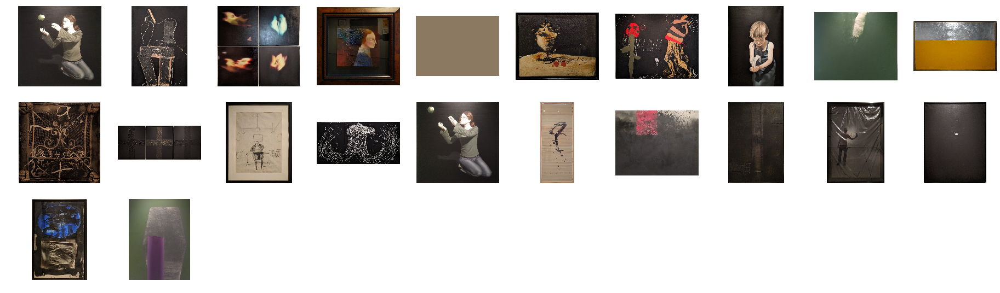

Room 10


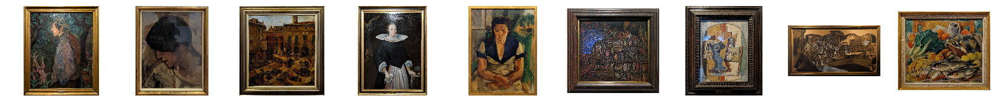

In [11]:
# Plot the rooms
for k in range(10):
    my_members = labels == k
    print('Room ' + str(k+1))
    plt.figure(figsize=(32,32))

    i=0
    n=0
    for f in sorted(glob.glob('../database/*.jpg')):
        if my_members[i] == True :
            img = cv.imread(f, cv.IMREAD_COLOR)
            img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
            ax = plt.subplot(10,10,n+1)
            plt.imshow(img)
            plt.axis('off')
            n += 1
        i+=1
    plt.show()
plt.show()